# Olist Data Analysis

In [ ]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import requests
import seaborn as sns
import statsmodels.formula.api as smf
from etl.utils.utils_methods import load_params
from google.cloud import bigquery
from matplotlib.ticker import PercentFormatter
from scipy.stats import skew

warnings.simplefilter(action="ignore", category=UserWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)

In [2]:
def set_plot_style(palette: str):
    sns.set_theme(
        context="notebook",  # paper/talk/poster
        style="whitegrid",  # white/dark/ticks
        palette=palette,  # colorblind/deep
        font_scale=1.1,
    )

    plt.rcParams.update(
        {
            "axes.titlesize": 14,
            "axes.labelsize": 12,
            "xtick.labelsize": 10,
            "ytick.labelsize": 10,
            "legend.fontsize": 10,
            "axes.spines.top": False,
            "axes.spines.right": False,
        }
    )


PALETTE = "colorblind"
palette = sns.color_palette(PALETTE)
COLORS = {"orders": palette[0], "revenue": palette[1], "aov": palette[2]}

set_plot_style(palette=PALETTE)

In [3]:
params = load_params()
PROJECT_ID = params["bigquery"]["project_id"]
DATASET_ID = params["bigquery"]["datasets"]["raw"]
CORE_DATASET_ID = params["bigquery"]["datasets"]["core"]
ROLLUP_DATASET_ID = params["bigquery"]["datasets"]["rollup"]
KPI_DATASET_ID = params["bigquery"]["datasets"]["kpi"]
BI_DATASET_ID = params["bigquery"]["datasets"]["bi"]
print("Working project ID: ", PROJECT_ID)
print("Dataset ID: ", DATASET_ID)
print("Core Dataset ID: ", CORE_DATASET_ID)
print("Rollup Dataset ID: ", ROLLUP_DATASET_ID)
print("KPI Dataset ID: ", KPI_DATASET_ID)
print("BI Dataset ID: ", BI_DATASET_ID)

Working project ID:  olist-data-warehouse-48014
Dataset ID:  olist_dw
Core Dataset ID:  olist_core
Rollup Dataset ID:  olist_rollup
KPI Dataset ID:  olist_kpi
BI Dataset ID:  olist_bi


In [4]:
def run_query(query: str, project_id: str) -> pd.DataFrame:
    """
    Run a query to a specified BigQuery project.

    Args:
        query (str): SQL query to run.
        project_id: ID of the BigQuery project to query.

    Returns:
        (pd.DataFrame): pandas DataFrame with the results of the query.
    """
    client = bigquery.Client(project=project_id)
    query_job = client.query(query)
    results = query_job.result()
    return results.to_dataframe()

## Business Context and Data Overview

In this notebook we analyze Olist's marketplace to identify revenue drivers, customer behavior patterns and oprational bottlenecks that may impact growth and customer satisfaction.</br>  
We gather the data from the Brazilian ecommerce dataset found on <a src="https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce/data">Kaggle</a>: as described by the data card Olist is the largest department store in brazilian marketplaces, it connects small businesses and merchants who are able to sell their products through the Olist store.</br>

The dataset has information of 100k orders from (October) 2016 to 2018 from multiple marketplaces.</br>

Throughout our analysis we'll keep monetary data (price, freight cost, revenue etc.) expressed in brazilian Reals since it doesn't affect the analysis.

## Time Analysis

Ecommerce is steadily growing worldwide and is predicted to grow further still, we check whether the demand is growing or stagnating: 

### Total Orders per month

The following analysis explores how demand expressed as total orders varies across time on a monthly unit:

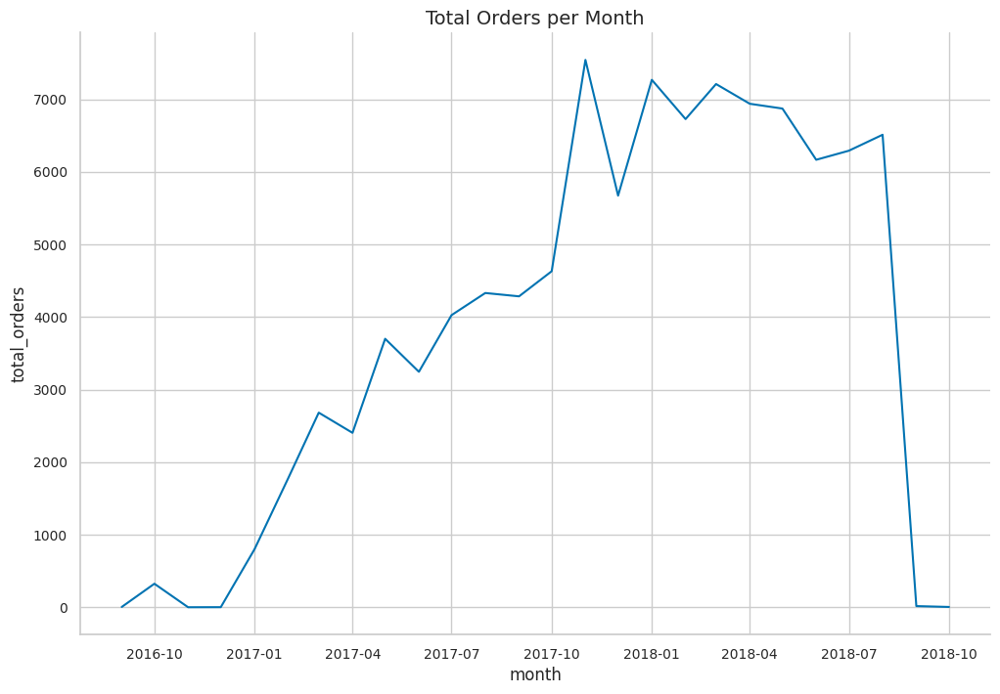

In [5]:
qry = f"""
SELECT DATE_TRUNC(date, MONTH) AS month,
SUM(total_orders) AS total_orders
FROM `{PROJECT_ID}.{KPI_DATASET_ID}.kpi_daily`
GROUP BY month
ORDER BY month
"""

df = run_query(query=qry, project_id=PROJECT_ID)

plt.figure(figsize=(12, 8))
sns.lineplot(data=df, x="month", y="total_orders")
plt.title("Total Orders per Month")
plt.show()

**Key insights:**
<ul>
    <li>Orders volume shows a consistent growth in 2017 and the first half of 2018, indicating a clear rising trend in demand.</li>
    <li>A sharp decline in orders is observed between August and October 2018, this suggests noise or incomplete data entry.</li>
    <li>A significant spike is observed on November 2017:</li>
</ul>

In [6]:
df[df["total_orders"] == df["total_orders"].max()]

,month,total_orders
14,2017-11-01,7544


this is related to the presence of a major promotional event, i.e. Black Friday, which in 2017 was on November 24th.

### YoY Monthly growth

Since in the data cover only one complete business year, the year-over-year analysis is defined comparing each month to the same month the year prior, this visualization shows the change for total orders, revenue and AOV:

In [7]:
qry = f"""
WITH monthly_kpis AS (
    SELECT
        DATE_TRUNC(date, MONTH) AS month,
        SUM(total_orders) AS total_orders,
        SUM(total_revenue) AS total_revenue,
        AVG(avg_order_value) AS avg_order_value
    FROM `{PROJECT_ID}.{KPI_DATASET_ID}.kpi_daily`
    GROUP BY month
)
SELECT
    curr.month,
    curr.total_orders AS orders_curr,
    prev.total_orders AS orders_prev,
    SAFE_DIVIDE(curr.total_orders - prev.total_orders, prev.total_orders) AS yoy_orders_growth,

    curr.total_revenue as revenue_curr,
    prev.total_revenue AS revenue_prev,
    SAFE_DIVIDE(curr.total_revenue - prev.total_revenue, prev.total_revenue) AS yoy_revenue_growth,

    curr.avg_order_value AS aov_curr,
    prev.avg_order_value AS aov_prev,
    SAFE_DIVIDE(curr.avg_order_value - prev.avg_order_value, prev.avg_order_value) AS yoy_aov_growth
    
FROM monthly_kpis curr
LEFT JOIN monthly_kpis prev
    ON curr.month = DATE_ADD(prev.month, INTERVAL 1 YEAR) 
"""

df_yoy = run_query(query=qry, project_id=PROJECT_ID)

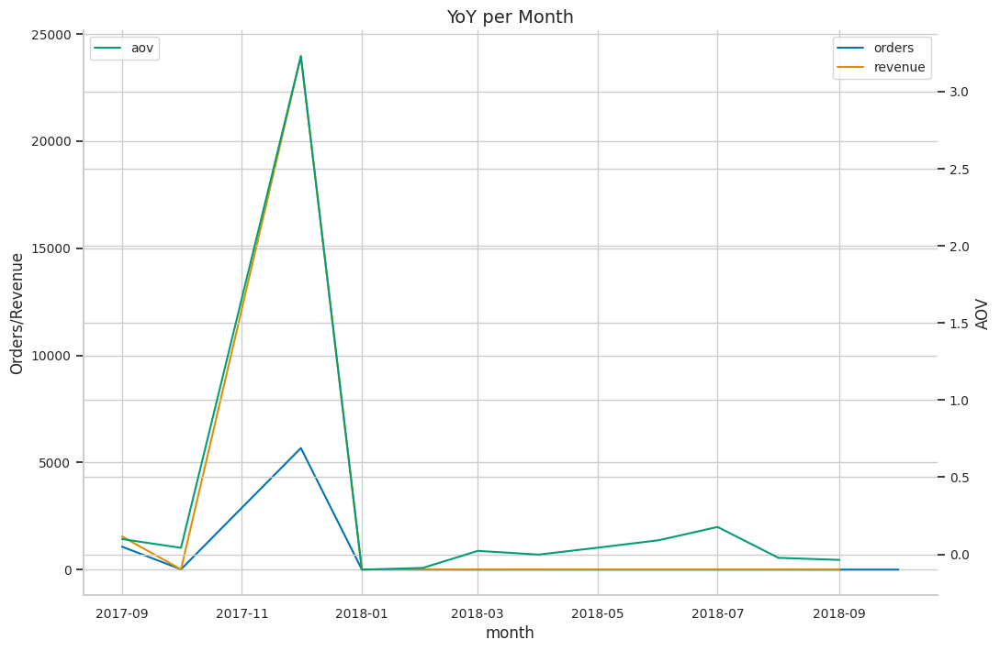

In [8]:
_, ax = plt.subplots(1, 1, figsize=(12, 8))
sns.lineplot(
    data=df_yoy,
    x="month",
    y="yoy_orders_growth",
    color=COLORS["orders"],
    label="orders",
    ax=ax,
)
sns.lineplot(
    data=df_yoy,
    x="month",
    y="yoy_revenue_growth",
    color=COLORS["revenue"],
    label="revenue",
    ax=ax,
)
ax2 = ax.twinx()
sns.lineplot(
    data=df_yoy, x="month", y="yoy_aov_growth", color=COLORS["aov"], label="aov", ax=ax2
)
ax2.legend(loc=2)
ax.set_ylabel("Orders/Revenue")
ax2.set_ylabel("AOV")
plt.title("YoY per Month")
plt.show()

**Key insights:**
<ul>
    <li>Orders and revenue move largely together across months, indicating that revenue growth during the period is primarily volume-driven rather than price-driven. AOV remains comparatively stable outside of peak periods.</li>
    <li>A pronounced spike is observed in November-December 2017 across all three metrics, consistent with the presence of a major promotional event (Black Friday). Notably, in this period revenue grows faster than order volume, suggesting an uplift in basket value and a higher share of multi-items purchases.</li>
    <li>This indicates that promotional periods do not merely pull forward demand, but also shift customer purchasing behavior toward higher-value orders.</li>
</ul>

### Seasonal Heatmap

This analysis examines customer purchasing behavior by looking at the seasonality of orders placed:

In [9]:
qry = f"""
SELECT
    EXTRACT(MONTH FROM date) AS month,
    EXTRACT(DAYOFWEEK FROM date) AS weekday,
    SUM(total_orders) AS total_orders
FROM `{PROJECT_ID}.{KPI_DATASET_ID}.kpi_daily`
GROUP BY month, weekday
ORDER BY month, weekday;
"""

df_seasons = run_query(query=qry, project_id=PROJECT_ID)

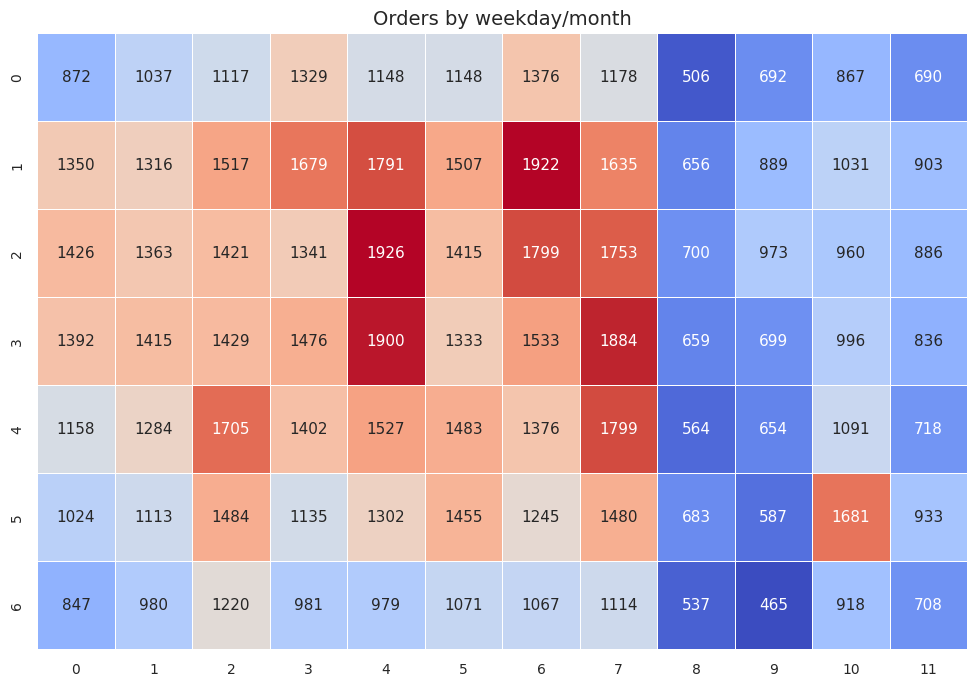

In [10]:
pt_seasons = df_seasons.pivot_table(
    index="weekday", columns="month", values="total_orders"
)
plt.figure(figsize=(12, 8))
sns.heatmap(
    data=pt_seasons.reset_index().to_numpy()[:, -12:].astype("int"),
    annot=True,
    fmt="d",
    annot_kws={"fontsize": "small"},
    linewidth=0.5,
    cmap="coolwarm",
    cbar=False,
    vmin=pt_seasons.min().min(),
    vmax=pt_seasons.max().max(),
)
plt.title("Orders by weekday/month")
plt.show()

**Key insights:**
<ul>
    <li>Order activity shows a strong weekday bias, with volumes consistently higher from Monday to Wednesday and lower during weekends. This suggests that purchasing behavior is predominantly driven by weekday routines rather than leisure-driven shopping.</li>
    <li>A clear seasonal concentration is observed between May and August, followed by a substantial decline in order volume from September through December. Excluding short-lived promotional spikes, this pattern appears structural and indicates lower demand in the latter part of the year.</li>
    <li>The combination of weekday concentration and mid-year seasonality points to a demand profile that is more utilitarian than impulse-drive, with limited evidence of holiday-led uplift.</li>
</ul>

## Geo Analysis

Brazil is divided in 26 state (and one federal district), each of them endowed with a certain degree of autonomy, therefore we're interested in analizing the ecommerce volume among the different states to check for regional differences, the following visualization  provides insight into total orders and revenue at both the state and city level:

In [13]:
qry = f"""
SELECT 
    state_code AS state,
    city,
    total_orders_placed AS total_orders,
    total_revenue_demand AS total_revenue,
    total_items_ordered as n_items,
    SAFE_DIVIDE(
        total_revenue_demand,
        total_orders_placed
    ) AS avg_revenue
FROM `{PROJECT_ID}.{BI_DATASET_ID}.bi_geo_kpi`
"""

df_geo = run_query(query=qry, project_id=PROJECT_ID)

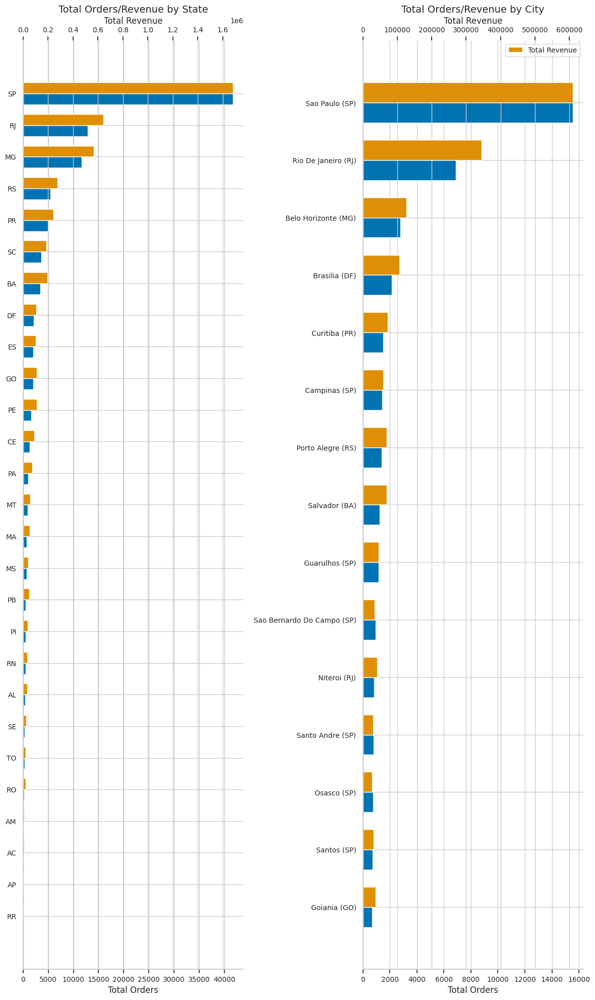

In [ ]:
df_state_ord = (
    df_geo.groupby(by=["state"]).sum().sort_values(by="total_orders", ascending=True)
)

df_city_ord = (
    df_geo.groupby(by=["city", "state"])
    .sum()
    .sort_values(by="total_orders", ascending=True)
    .iloc[-15:, :]
    .reset_index()
)

y_idx_list = [
    df_state_ord.index,
    df_city_ord["city"] + " (" + df_city_ord["state"] + ")",
]
x_idx_list = [np.arange(len(df_state_ord)), np.arange(len(df_city_ord))]
labels = ["State", "City"]

bar_width = 0.35
_, axes = plt.subplots(1, 2, figsize=(12, 20))
for df, x_idx, y_idx, label, ax in zip(
    [df_state_ord, df_city_ord],
    x_idx_list,
    y_idx_list,
    labels,
    axes.ravel(),
    strict=True,
):
    ax.barh(
        x_idx,
        df["total_orders"],
        height=bar_width,
        color=COLORS["orders"],
        label="Total Orders",
    )
    ax2 = ax.twiny()
    ax2.barh(
        x_idx + bar_width,
        df["total_revenue"],
        height=bar_width,
        color=COLORS["revenue"],
        label="Total Revenue",
    )

    ax.set_title(f"Total Orders/Revenue by {label}")
    ax.set_xlabel("Total Orders")
    ax2.set_xlabel("Total Revenue")
    ax.set_yticks(x_idx + bar_width / 2)
    ax.set_yticklabels(y_idx)

plt.legend()
plt.tight_layout()
plt.show()

**Key insights:**

<ul>
    <li>States and cities with larger population tend to contribute more to total revenue and orders volume. This pattern may reflects that performance is mainly driven by demand rather than high-margin purchases.</li>
    <li>São Paulo (SP) is the main driver of both order and revenue, followed by Rio de Janeiro.</li>
</ul>


In [16]:
qry = f"""
SELECT
seller_id, city, state
FROM `{PROJECT_ID}.{DATASET_ID}.sellers`
WHERE city IN {"sao paulo", "rio de janeiro"}
"""
df = run_query(query=qry, project_id=PROJECT_ID)
df["city"].value_counts()

city
sao paulo         694
rio de janeiro     96
Name: count, dtype: int64

Despite Rio de Janeiro has roughly half the population of São Paulo, it has less than a seventh of its sellers, there could be reasonable motivations behind their volume difference or a natural direction to expand business.

### Average price and Total revenue by state

The scope of this analysis is to check whether the revenue generated is driven primarily by high-margin purchases or plainly by orders volume; the chart compares the average item price and total revenue by state:

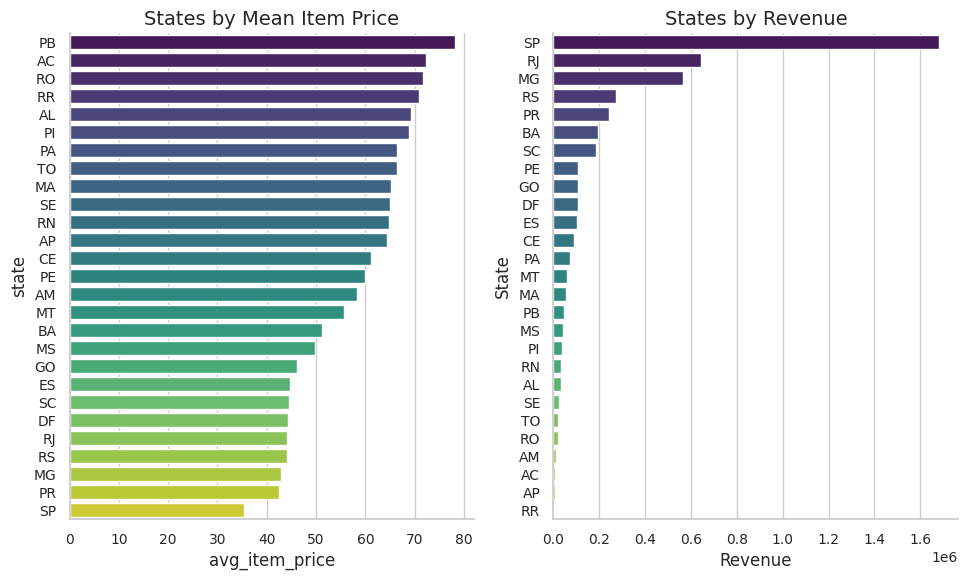

In [ ]:
df_price_revenue = (
    df_geo.groupby(by=["state"])
    .agg({"total_orders": "sum", "total_revenue": "sum", "n_items": "sum"})
    .reset_index()
)
df_price_revenue["avg_item_price"] = (
    df_price_revenue["total_revenue"] / df_price_revenue["n_items"]
)

_, axes = plt.subplots(1, 2, figsize=(10, 6))
for cname, label, ax in zip(
    ["avg_item_price", "total_revenue"],
    ["Mean Item Price", "Revenue"],
    axes.ravel(),
    strict=True,
):
    sns.barplot(
        data=df_price_revenue.sort_values(by=cname, ascending=False),
        x=cname,
        y="state",
        ax=ax,
        palette="viridis",
    )
    ax.set_title(f"States by {label}")
    plt.xlabel(label)
    plt.ylabel("State")
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>States driving the largest share of total revenue exhibit comparatively lower average item prices, while states with higher average prices contribute marginally to overall revenue. This suggests that revenue concentration is primarily volume-driven rather than price-driven.</li>
    <li>Higher-priced states tend to be smaller markets, where lower demand scale and limited supply may constrain transaction volume despite higher per-item prices.</li>
</ul>

In [24]:
print(
    "Correlation score between mean price and total revenue by state: ",
    df_price_revenue.select_dtypes(include=float)
    .corr(method="spearman")
    .loc["total_revenue", "avg_item_price"],
)

Correlation score between mean price and total revenue by state:  -0.8034188034188035


### Customer Revenue by State

To gain more insight on the revenue model, we investigate the average revenue generated by customers across state:

In [20]:
qry = f"""
SELECT
    state_code AS state,
    SUM(total_customers) AS total_customers,
    SUM(total_revenue_demand) AS total_revenue,
    SAFE_DIVIDE(
        SUM(total_revenue_demand),
        SUM(total_customers) 
    ) AS revenue_per_customer
FROM `{PROJECT_ID}.{BI_DATASET_ID}.bi_geo_kpi`
GROUP BY state_code
ORDER BY revenue_per_customer DESC;
"""

df_cr_state = run_query(query=qry, project_id=PROJECT_ID)

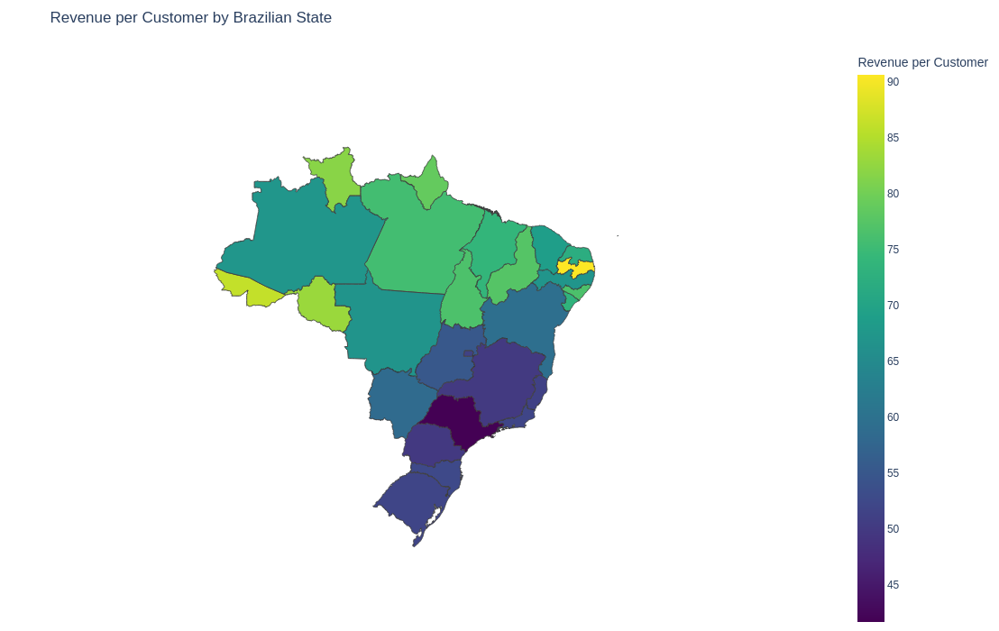

In [23]:
url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
geojson_data = requests.get(url).json()

fig = px.choropleth(
    df_cr_state,
    geojson=geojson_data,
    locations="state",
    featureidkey="properties.sigla",
    # locationmode="ISO-3166-2",
    color="revenue_per_customer",
    scope="south america",
    labels={"revenue_per_customer": "Revenue per Customer"},
    color_continuous_scale="Viridis",
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width=900,
    height=700,
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    title="Revenue per Customer by Brazilian State",
)

fig.show()

**Key insights:**
<ul>
    <li>States that contributes the most to total revenue tend to exhibit lower average revenue per customer.</li>
    <li>This pattern reinforces the hypotheses that revenue concentration is driven by scale and demand availability, rather than by high-margin or high-value orders.</li>
    <li>From a business perspective, growth strategies in these regions may benefits more from customer retention and operational efficienct than from premium pricing.</li>
</ul>

### Delayed orders proportion by state

Delivery delays are a key indicators of logistics efficiency. The following analysis visualizes the percentage of delayed orders by state to uncover geographic disparities.

In [24]:
qry = f"""
SELECT
    c.state,
    COUNT(*) as total_orders,
    AVG(fo.delay) AS avg_delay,
    AVG(CASE WHEN fo.delay > 0 THEN 1 ELSE 0 END) AS pct_delayed,
    AVG(CASE WHEN fo.delay > 0 THEN fo.delay END) AS avg_late_delayed
FROM `{PROJECT_ID}.{CORE_DATASET_ID}.fact_orders` fo
JOIN `{PROJECT_ID}.{DATASET_ID}.customers` c
    ON fo.customer_unique_id = c.customer_uid
GROUP BY c.state
ORDER BY pct_delayed DESC;
"""

df_delay_state = run_query(query=qry, project_id=PROJECT_ID)

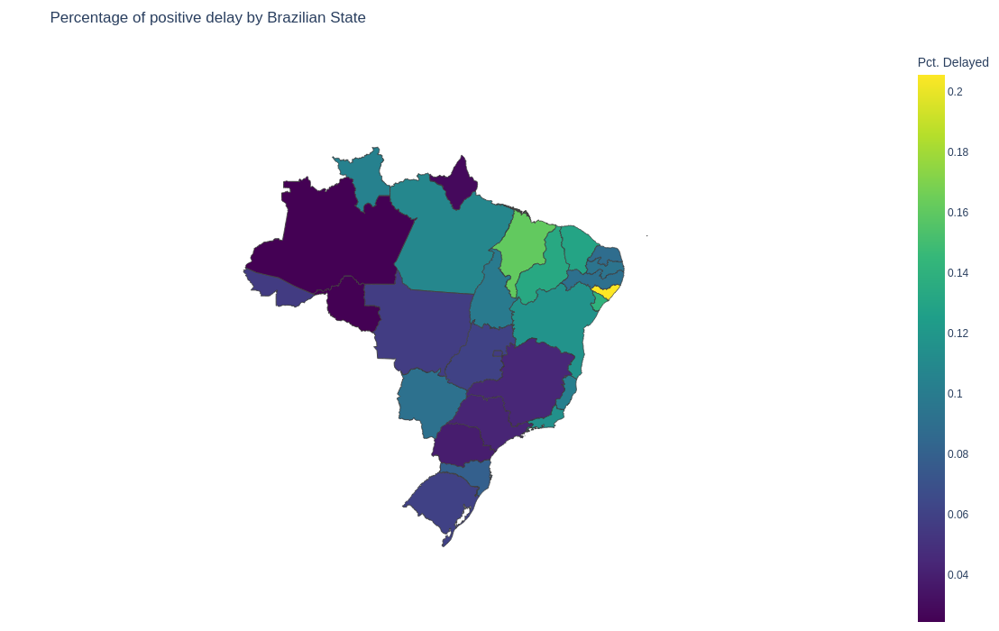

In [22]:
fig = px.choropleth(
    df_delay_state,
    geojson=geojson_data,
    locations="state",
    featureidkey="properties.sigla",
    color="pct_delayed",
    scope="south america",
    labels={"pct_delayed": "Pct. Delayed"},
    color_continuous_scale="Viridis",
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width=900,
    height=700,
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    title="Percentage of positive delay by Brazilian State",
)

fig.show()

**Key insights:**
<ul>
    <li>The distribution shows substantial regional variation, with states in the North-East exhibiting higher delay percentage compared to the North-West and South.</li>
    <li>This pattern may reflect regional differences in logistics infrastructure and delivery efficiency.</li>
    <li>From a business perspective, these regions may benefits from targeted logistics investments rather than demand-side interventions.</li>
</ul>

## Product analysis

The following analyis explores how item volume and total revenue are distributed across product categories, and check whether the marketplace relies on a selected group of products.

### Top/Bottom product categories

This visualization shows the top/bottom 15 product categories both by items sold and total revenue, to provide insight into customer purchase preferences and revenue drivers:

In [46]:
qry = f"""
SELECT
    category,

    -- Volume
    SUM(total_items_sold) AS total_items_sold,
    SUM(total_orders) AS total_orders,

    -- Revenue
    SUM(total_revenue) AS total_revenue,
    SAFE_DIVIDE(
        SUM(total_revenue),
        SUM(total_items_sold)
    ) AS avg_price_per_item,

    -- Logistics 
    SAFE_DIVIDE(
        SUM(avg_delivery_time * total_orders),
        SUM(total_orders)
    ) AS avg_delivery_time,

    SAFE_DIVIDE(
        SUM(pct_delayed * total_orders),
        SUM(total_orders)
    ) AS pct_delayed 

FROM `{PROJECT_ID}.{BI_DATASET_ID}.bi_product_kpi`
GROUP BY category;
"""

df_category = run_query(query=qry, project_id=PROJECT_ID)

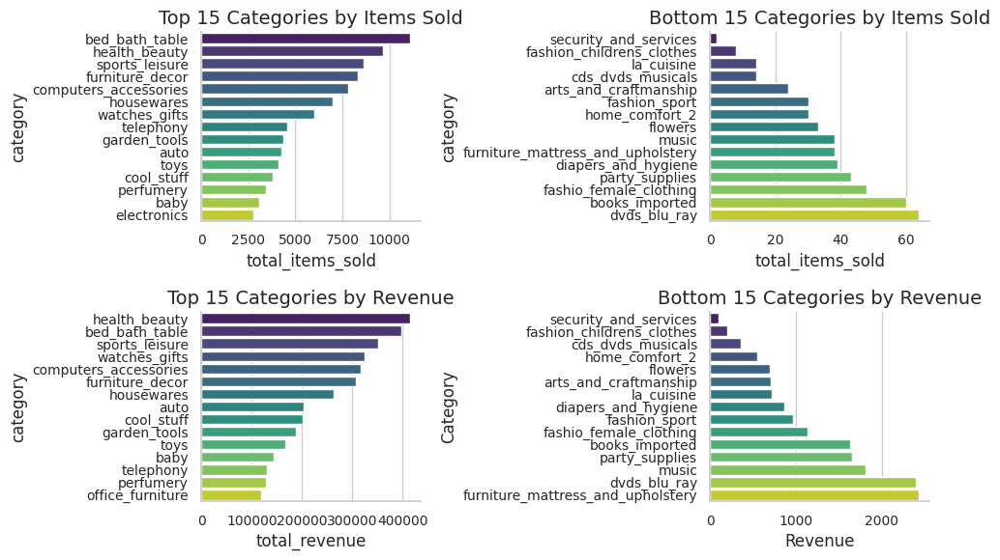

In [ ]:
_, axes = plt.subplots(2, 2, figsize=(10, 6))
for cname, label, is_ascending, ax in zip(
    ["total_items_sold", "total_items_sold", "total_revenue", "total_revenue"],
    ["Items Sold", "Items Sold", "Revenue", "Revenue"],
    [False, True, False, True],
    axes.ravel(),
    strict=True,
):
    sns.barplot(
        data=df_category.sort_values(by=cname, ascending=is_ascending).iloc[:15, :],
        x=cname,
        y="category",
        ax=ax,
        palette="viridis",
    )
    top_bottom = "Bottom" if is_ascending else "Top"
    ax.set_title(f"{top_bottom} 15 Categories by {label}")
    plt.xlabel(label)
    plt.ylabel("Category")
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>Self-care categories (bed/bath/table, beauty products and sport equipments) dominates marketplace performance, leading in both sales volume and revenue generation.</li>
    <li>Conversely, security and services, fashion products, and media categories (CDs/DVDs) exhibit consistently low contributions across both dimensions.</li>
</ul>

### Pareto Analysis

Building on the previous analysis, we examine the cumulative proportion of items sold and revenue by product category to assess whether marketplace performance is driven by a small number of categories:

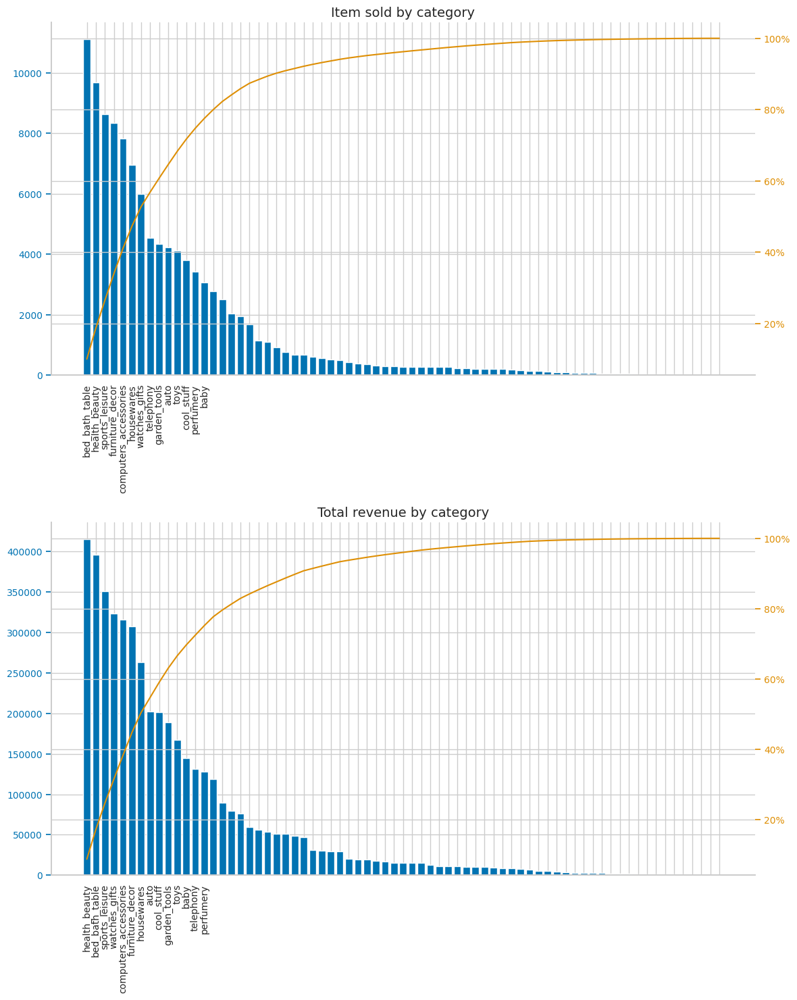

In [ ]:
cat_20pct = int(df_category["category"].dropna().size * 0.2)
_, axes = plt.subplots(2, 1, figsize=(12, 15))

for cname, label, ax in zip(
    ["total_items_sold", "total_revenue"],
    ["Item sold", "Total revenue"],
    axes.ravel(),
    strict=True,
):
    df_feat = (
        df_category[["category", cname]].dropna().sort_values(by=cname, ascending=False)
    )
    df_feat["cumpercentage"] = 100 * (df_feat[cname].cumsum() / df_feat[cname].sum())

    ax.bar(df_feat["category"], df_feat[cname], color="C0")
    ax2 = ax.twinx()
    ax2.plot(df_feat["category"], df_feat["cumpercentage"], color="C1")
    ax2.yaxis.set_major_formatter(PercentFormatter())

    ax.tick_params(axis="y", colors="C0")
    ax2.tick_params(axis="y", colors="C1")
    ax.set_xticklabels(df_feat["category"], rotation=90)
    ax2.set_xticklabels(df_feat["category"], rotation=90)
    plt.setp(ax.get_xticklabels()[cat_20pct:], visible=False)
    plt.setp(ax2.get_xticklabels()[cat_20pct:], visible=False)
    plt.title(f"{label} by category")
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>We observe that 20% of the product category is responsible of both 80% of items sold as well as 78% of revenue share.</li>
    <li>These findings further indicates that categories related to personal and household care dominate both volume and revenue, suggesting broad, recurring demand.</li>
</ul>

## Reviews Analysis

Customer reviews provide a direct signal of satisfaction and are influenced by multiple aspects of the purchase experience.</br> In this section, we analyze how logistics- and price-related features relate to review scores, progressively moving from descriptive patterns to conditional effects.</br>
**Note:** *the data card doen't give a clear indication on how the score scale should be interpreted, but comparing reviews score to their comments it's clear that it's a 1-to-5 stars sysyem (1 stands for lowest satisfaction, 5 for highest), this is what we assume throughout the analysis*

### Review score distribution

We begin by examining the distribution of review scores:

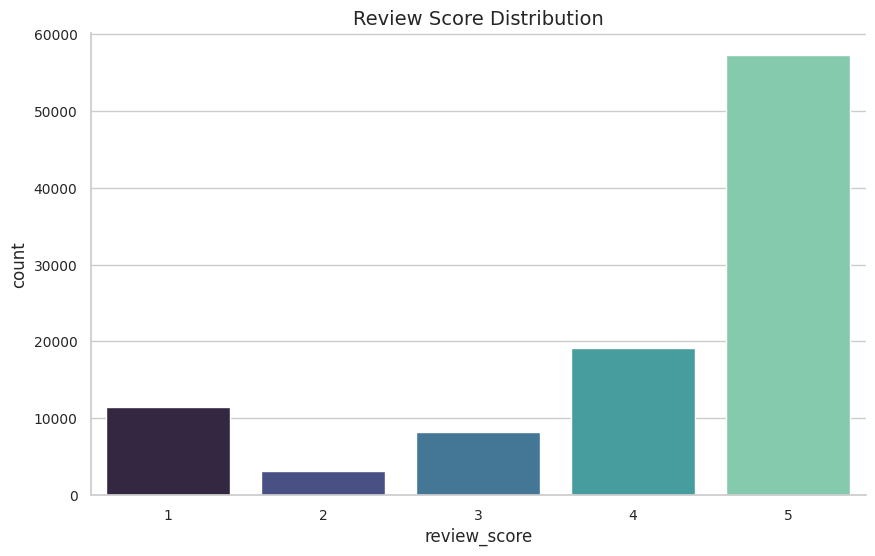

In [28]:
qry = f"""
SELECT score AS review_score,
COUNT(*) AS count
FROM `{PROJECT_ID}.{DATASET_ID}.reviews`
GROUP BY score
ORDER BY score DESC
"""

df = run_query(query=qry, project_id=PROJECT_ID)

plt.figure(figsize=(10, 6))
sns.barplot(data=df, x="review_score", y="count", palette="mako")
plt.title("Review Score Distribution")
plt.show()

In [6]:
100 * df["count"] / df["count"].sum()

0    57.776344
1    19.291704
2     8.242965
3     3.175643
4    11.513344
Name: count, dtype: Float64

**Key insight:**
<ul>
    <li>The ratings are highly skewed toward positive feedback: approximately 58% of reviews award the maximum score, while nearly 76% of reviewed orders receive at least 4 out of 5 stars.</li>
    <li>This distribution indicates generally high customer satisfaction but also suggests limited variance at the upper end of the scale.</li>
</ul>

Roughly 58% of the reviews have the highest score, and 76% of reviewed orders earned 4 of 5 stars, that's an impressive result, but it still raise the question:</br><i>What affects the review scores positively or negatively?</i></br>To answer this question we retrive a dataframe that has data for every order such as:</br>
<ul>
    <li>delivery time</li>
    <li>delay</li>
    <li>price</li>
    <li>freight value</li>
</ul>
we supect have an impact on ratings.

In [27]:
qry = f"""
SELECT 
o.order_id,
o.product,
c.state AS state,
o.order_status AS status,
o.delivery_time,
o.delay,
o.price, 
o.freight_value,
o.basket_size,
o.n_products,
r.score AS score
FROM `{PROJECT_ID}.{CORE_DATASET_ID}.fact_orders` o
JOIN `{PROJECT_ID}.{DATASET_ID}.customers` c ON o.customer_id = c.customer_id
JOIN `{PROJECT_ID}.{CORE_DATASET_ID}.reviews_agg` r ON o.order_id = r.order_id
WHERE r.score IS NOT NULL;
"""

order_rating = run_query(query=qry, project_id=PROJECT_ID)
order_rating.head()

,order_id,product,state,status,delivery_time,delay,price,freight_value,basket_size,n_products,score
0,bfbd0f9bdef84302105ad712db648a6c,5a6b04657a4c5ee34285d1e4619a96b4,SP,delivered,54,36,24.981192,8.49,3,1,1
1,98974b076b01553d49ee6467905675a7,ecf23a6c1689e2bed38171ececac6138,SP,delivered,43,-6,20.341061,11.23,1,1,1
2,c4b41c36dd589e901f6879f25a74ec1d,9e93b2c4cb5eea05e75a481c129b104d,SP,delivered,36,-14,1.832361,8.72,1,1,5
3,d2292ff2201e74c5db154d1b7ae68cbb,e1ed3c28e40cbce2783e79eea79e8701,SP,delivered,29,-20,9.235841,11.74,1,1,5
4,95e01270fcbae9863423400103359279,b73f6899a58fe7a37e55149e9a11c717,SP,delivered,30,-19,16.100718,28.23,1,1,2


Let's see some summary statistics for the numerical features:

In [8]:
order_rating.describe()

,delivery_time,delay,price,freight_value,basket_size,n_products,score
count,95824.0,95824.0,97917.000000,97917.000000,97917.0,97917.0,98673.0
mean,12.052273,-10.993018,25.455809,22.804014,1.140844,1.037899,4.086062
std,9.466046,9.950629,38.772509,21.621022,0.533783,0.225801,1.347714
min,0.0,-146.0,0.157324,0.000000,1.0,1.0,1.0
25%,6.0,-16.0,8.495493,13.840000,1.0,1.0,4.0
50%,10.0,-11.0,16.084060,17.160000,1.0,1.0,5.0
75%,15.0,-6.0,27.744541,24.010000,1.0,1.0,5.0
max,208.0,188.0,2487.569280,1794.960000,21.0,8.0,5.0


**Key insights:**
<ul>
    <li>Delay is mostly negative (more than 75% of orders arrived earlier than expected), however there is at least of case of extreme delay (one order was delivered 6 months late!).</li>
    <li>Price and freight value have comparables mean and stadard deviation, however these features are bounded from below by 0, we therefore suspect and heavier right tail in their distribution.</li>
    <li>The mean and the three inter-quartiles of both basket_size and n-products is 1, suggesting that most orders were single-product (i.e. include only one product type) and single-item (i.e. include only one istance of that product).</li>
</ul>

## Univariate Analysis

Before analyzing the relationship between features and review scores, we examine the marginal distributions of key variables to understand their scale, shape, and suitability for modeling:

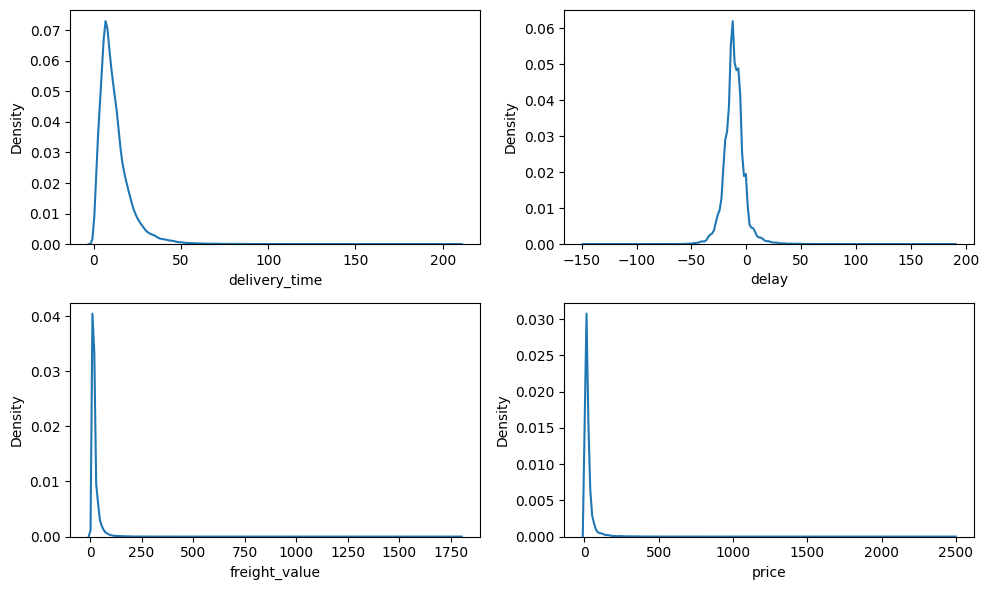

In [ ]:
_, axes = plt.subplots(2, 2, figsize=(10, 6))
for ax, col in zip(
    axes.ravel(), ["delivery_time", "delay", "freight_value", "price"], strict=True
):
    sns.kdeplot(data=order_rating, x=col, ax=ax)
plt.tight_layout()
plt.show()

In [13]:
for col in ["delivery_time", "delay", "freight_value", "price"]:
    print(f"{col} skewness: {skew(order_rating[col], nan_policy='omit')}")

delivery_time skewness: 3.7661870210394484
delay skewness: 1.9061751211214961
freight_value skewness: 12.11600010799198
price skewness: 9.607110875345345


**Key insights:**
<ul>
    <li>While delivery delay exhibits a roughly symmetric distribution, delivery time, freight value, and item price display pronounced right skewness.</li>
    <li>This pattern is common in transactional data and does not necessarily indicate the presence of outliers.</li>
</ul>

For descriptive analyses, all variables are examined in their original units to preserve interpretability. For regression modeling, log-transformed versions are introduced to mitigate skewness and reduce the influence of extreme values.

### Bivariate Analysis

To explore how individual features relate to customer satisfaction, we analyze their distributions across review score levels:

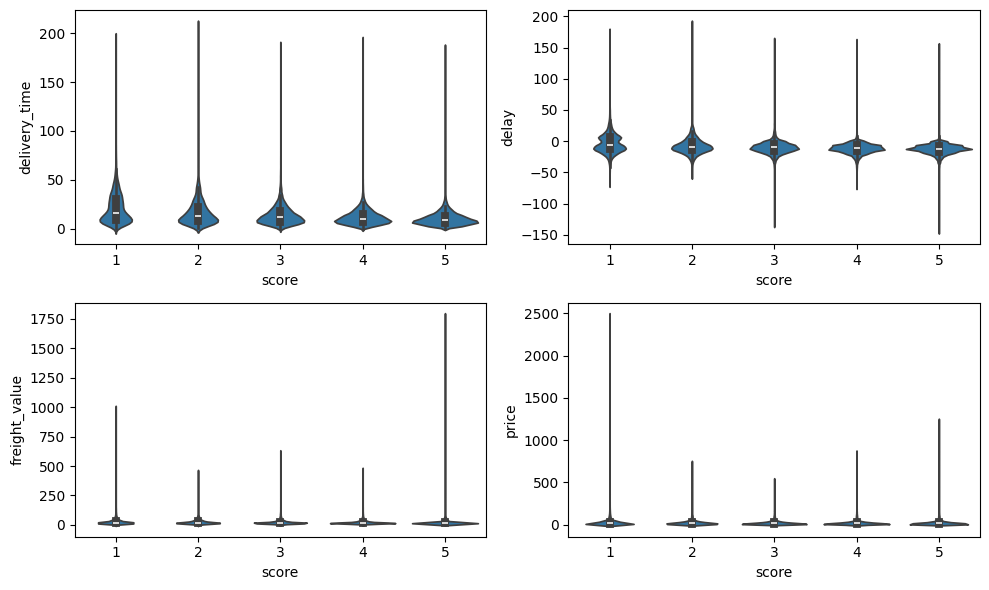

In [ ]:
_, axes = plt.subplots(2, 2, figsize=(10, 6))
for ax, col in zip(
    axes.ravel(), ["delivery_time", "delay", "freight_value", "price"], strict=True
):
    sns.violinplot(data=order_rating, x="score", y=col, ax=ax)
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>Despite the presence of heavy tails, a clear pattern emerges: low-rated orders are more frequently associated with positive delays (late deliveries), whereas high-rated orders are often delivered early or on time. This aligns with customer expectations, where delays negatively impact satisfaction.</li>
    <li>Interestingly, 1-star reviews tend to include some of the most expensive orders, suggesting potential dissatisfaction among high-value customers—a pattern that warrants further investigation.</li>
</ul>
To see better the main distribution we produce boxplot without fliers:

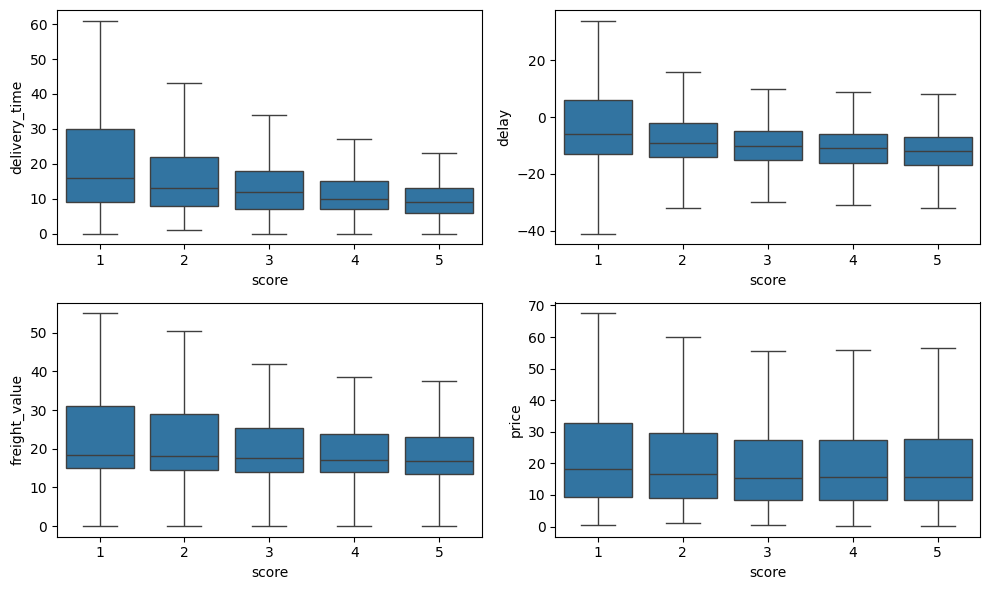

In [ ]:
_, axes = plt.subplots(2, 2, figsize=(10, 6))
for ax, col in zip(
    axes.ravel(), ["delivery_time", "delay", "freight_value", "price"], strict=True
):
    sns.boxplot(data=order_rating, x="score", y=col, showfliers=False, ax=ax)
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>When excluding extreme values, the central distributions become more apparent. For both delivery time and delivery delay, the distributions narrow and median values decrease as review scores increase, indicating shorter and more consistent delivery performance among highly rated orders.</li>
    <li>Freight value and price exhibit similar but less pronounced trends, suggesting a weaker and less consistent relationship with review scores.</li>
</ul>
To furthr analyse how the features central tendencies changes with score we make pointplots for both the mean and median of each features across the review score values:

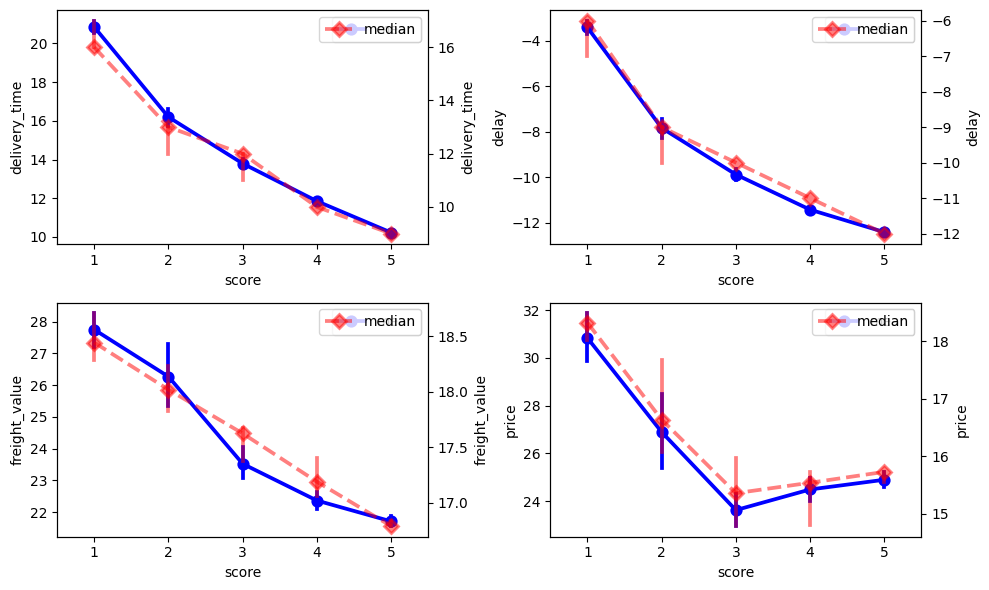

In [ ]:
_, axes = plt.subplots(2, 2, figsize=(10, 6))
for ax, col in zip(
    axes.ravel(), ["delivery_time", "delay", "freight_value", "price"], strict=True
):
    sns.pointplot(
        data=order_rating,
        x="score",
        y=col,
        estimator="mean",
        errorbar=("ci", 95),
        color="blue",
        label="mean",
        ax=ax,
    )
    ax2 = ax.twinx()
    sns.pointplot(
        data=order_rating,
        x="score",
        y=col,
        estimator="median",
        errorbar=("ci", 95),
        color=(1.0, 0.0, 0.0, 0.5),
        linestyle="--",
        marker="D",
        label="median",
        ax=ax2,
    )
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>Point plots of means and medians further confirm the previous findings. For delivery time and delay, both statistics closely align and follow a clear decreasing trend as review scores increase, indicating a strong and consistent effect.</li>
    <li>In contrast, freight value and price display more erratic central tendencies across score levels, suggesting they may act as confounding or secondary factors rather than primary drivers of customer satisfaction.</li>
</ul>

### Reviews multiple regression

While the previous analyses highlight unconditional relationships, we now estimate conditional average effects using a multivariate regression model.</br>
To prepare the data for modeling, skewed variables are log-transformed (see technical note), and the analysis is restricted to orders containing a single distinct product (including orders with multiple units of the same product). This ensures that review scores can be reasonably attributed to a specific product and delivery experience.

*Technical note:* 
<ul>
    <li>OLS models work best when the residuals assumption is satisfied, i.e. when the residuals are normally distributed,  reducing the skewness and making the data more symmetrical helps.</li>
    <li>Linear models assume a linear relationship between the dependent and the independent variables, an heavy tail in a distribution can suggest a non-linear relationship and a log-transformation can reduce non-linearity.</li>
    <li>A skewed feature often has heteroscedastic (non constant variance), while linear regression assumes the variance of the residual constant (homoscedasticity).</li>
</ul>

In [17]:
for cname in ["delivery_time", "price", "freight_value"]:
    order_rating["log_" + cname] = np.log1p(order_rating[cname])

order_rating.head()

,order_id,product,state,status,delivery_time,delay,price,freight_value,basket_size,n_products,score,log_delivery_time,log_price,log_freight_value
0,bfbd0f9bdef84302105ad712db648a6c,5a6b04657a4c5ee34285d1e4619a96b4,SP,delivered,54,36,24.981192,8.49,3,1,1,4.007333,3.257373,2.250239
1,98974b076b01553d49ee6467905675a7,ecf23a6c1689e2bed38171ececac6138,SP,delivered,43,-6,20.341061,11.23,1,1,1,3.78419,3.060633,2.503892
2,c4b41c36dd589e901f6879f25a74ec1d,9e93b2c4cb5eea05e75a481c129b104d,SP,delivered,36,-14,1.832361,8.72,1,1,5,3.610918,1.041111,2.274186
3,d2292ff2201e74c5db154d1b7ae68cbb,e1ed3c28e40cbce2783e79eea79e8701,SP,delivered,29,-20,9.235841,11.74,1,1,5,3.401197,2.325895,2.544747
4,95e01270fcbae9863423400103359279,b73f6899a58fe7a37e55149e9a11c717,SP,delivered,30,-19,16.100718,28.23,1,1,2,3.433987,2.839120,3.375196


In [18]:
order_rating_1p = order_rating[order_rating["n_products"] == 1].dropna()
model = smf.ols(
    "score ~ delay + log_delivery_time + log_price + log_freight_value + C(state)",
    data=order_rating_1p,
).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  score   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.122
Method:                 Least Squares   F-statistic:                     432.3
Date:                Thu, 25 Dec 2025   Prob (F-statistic):               0.00
Time:                        10:46:58   Log-Likelihood:            -1.4770e+05
No. Observations:               93155   AIC:                         2.955e+05
Df Residuals:                   93124   BIC:                         2.958e+05
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             5.2960      0.13

**Key insights:**
<ul>
    <li>The model explains approximately 12.2% of the variance in review scores, which—while modest—is consistent with expectations for subjective rating data.</li>
    <li>F-statistic at 0.00 suggests that the model is statistically meaningful.</li>
    <li>Delivery delay emerges as the strongest predictor, with a coefficient of −0.0247, implying that a 10-day increase in delay is associated with a reduction of roughly 0.25 points in the review score.</li>
    <li>Delivery time also shows a statistically significant negative association, whereas freight value has a weaker effect and price does not appear to be a strong determinant of review scores.</li>
    <li>The elevated condition number suggests potential multicollinearity, likely reflecting the structural relationship between delivery time, delays, and freight costs.</li>
</ul>

### Reviews by Products

So far, the review score analysis has focused on logistics-related and economic factors, such as delivery performance, price, and freight costs. However, an important component of customer satisfaction remains unaccounted for: the intrinsic quality of the product itself.</br>
Estimating product-level effects poses a methodological challenge due to the high cardinality of the product dimension, which includes nearly 33,000 unique items.</br> To address this, we adopt two complementary approaches: (i) aggregating effects at the product category level, and (ii) estimating individual product contributions using a mixed-effects regression model.

### Reviews - Categories effects

We first retrieve the necessary data, i.e. the review score at the product/category level:

In [38]:
qry = f"""
WITH single_product_orders AS (
SELECT 
    oi.product_id,
    oi.order_id,
    SUM(oi.freight_value) AS order_freight_value,
    SUM(oi.item_price) AS order_price_value,
    SUM(oi.item_total_value) AS order_total_value,
    COUNT(oi.order_item_id) AS items_per_order,
    MAX(o.delivery_time) AS delivery_time,
    MAX(o.delay) AS delay,
    MAX(r.score) AS review_score
    
FROM `{PROJECT_ID}.{CORE_DATASET_ID}.fact_order_items` oi
JOIN `{PROJECT_ID}.{CORE_DATASET_ID}.fact_orders` o
    ON oi.order_id = o.order_id
LEFT JOIN `{PROJECT_ID}.{CORE_DATASET_ID}.fact_reviews` r
    ON oi.order_id = r.order_id
WHERE o.n_products = 1
GROUP BY
    oi.product_id, 
    oi.order_id
)
SELECT
    spo.product_id,
    dp.category,
    
    -- Review
    COUNT(spo.review_score) AS n_reviews,
    AVG(spo.review_score) AS avg_score,
    
    -- Logistic
    AVG(spo.delivery_time) AS avg_delivery_time,
    AVG(spo.delay) AS avg_delay,
    AVG(CASE WHEN spo.delay > 0 THEN 1 ELSE 0 END) AS pct_delayed,

    --Economics
    AVG(spo.order_price_value) AS avg_price,
    AVG(spo.order_freight_value) AS avg_freight_value

FROM single_product_orders spo
JOIN `{PROJECT_ID}.{CORE_DATASET_ID}.dim_product` dp
    ON spo.product_id = dp.product_id
GROUP BY spo.product_id, dp.category
HAVING n_reviews > 0;
"""

product_rating = run_query(query=qry, project_id=PROJECT_ID)
product_rating.head()

,product_id,category,n_reviews,avg_score,avg_delivery_time,avg_delay,pct_delayed,avg_price,avg_freight_value
0,5dbf50af9485478b933f1028e108640d,electronics,8,3.750000,12.375000,-15.375000,0.0,1.478151,23.498750
1,72b253635b316f49e42e618d6e585ebc,toys,6,3.833333,6.833333,-13.000000,0.0,3.242107,19.708333
2,cdafffbe81c76e4cb8b1270523215c82,perfumery,6,3.833333,7.500000,-8.833333,0.0,1.231446,16.893333
3,2083a6feb4bbb31f6abc92fc24e468c0,telephony,18,4.111111,6.722222,-15.277778,0.0,1.850870,15.813889
4,7932fcce65e2aee84d6feb4a288f9cb9,fashion_underwear_beach,7,3.714286,7.833333,-9.833333,0.0,1.248015,13.205714


In [41]:
product_rating.describe()

,n_reviews,avg_score,avg_delivery_time,avg_delay,pct_delayed,avg_price,avg_freight_value
count,30801.0,30801.000000,30100.000000,30100.00000,30801.000000,30801.000000,30801.000000
mean,3.075225,4.118909,11.816624,-11.14237,0.063840,29.270209,23.407109
std,9.214681,1.164830,8.253456,9.02225,0.207798,50.258471,23.454753
min,1.0,1.000000,1.000000,-139.00000,0.000000,0.157324,5.700000
25%,1.0,3.857143,7.000000,-15.00000,0.000000,8.249592,14.280000
50%,1.0,4.500000,10.000000,-11.00000,0.000000,16.195113,17.620000
75%,2.0,5.000000,14.666667,-7.00000,0.000000,31.261194,23.830000
max,427.0,5.000000,195.000000,167.00000,1.000000,2487.569280,1794.960000


Raw average review scores vary substantially in reliability due to differing numbers of reviews across products. Products with few reviews are particularly susceptible to noise, leading to high-variance estimates.</br> 
To account for this, we apply Bayesian shrinkage to product-level average scores. This approach adjusts each product’s observed mean toward the global average in proportion to its uncertainty, effectively trading a small amount of bias for a significant reduction in variance.</br>
The shrinkage intensity is governed by a parameter k, which represents the approximate number of reviews required for a product’s observed rating to be considered reliable.</br> This parameter is estimated directly from the data.

In [37]:
# within-product variance
sigma2_within = order_rating["score"].var()
# overall average reviews mean
mu = np.average(product_rating["avg_score"], weights=product_rating["n_reviews"])
# observed variance of product means
observed_var = np.average(
    (product_rating["avg_score"] - mu) ** 2, weights=product_rating["n_reviews"]
)
# noise variance
noise_var = np.average(
    sigma2_within / product_rating["n_reviews"], weights=product_rating["n_reviews"]
)
# between-product variance
sigma2_between = max(observed_var - noise_var, 1e-6)
k = sigma2_within / sigma2_between
print("sigma2_within: ", sigma2_within)
print("sigma2_between: ", sigma2_between)
print("k: ", k)

sigma2_within:  1.816332506974328
sigma2_between:  0.18115017869691985
k:  10.026666934804473


We can now compute the shrunk scores:

In [38]:
def apply_mean_shrinkage(df, score_col="avg_score", count_col="n_reviews", k=20):
    global_mean = np.average(df[score_col], weights=df[count_col])

    shrunk = (df[count_col] * df[score_col] + k * global_mean) / (df[count_col] + k)

    return shrunk


product_rating["shrunk_score"] = apply_mean_shrinkage(df=product_rating, k=10)
product_rating.head()

,product_id,category,n_reviews,avg_score,avg_delivery_time,avg_delay,pct_delayed,avg_price,avg_freight_value,shrunk_score
0,9c7bdf67b06b419aefb93cfdfc96c55d,sports_leisure,11,4.181818,11.900000,-8.100000,0.181818,3.036941,11.532727,4.136438
1,eba7488e1c67729f045ab43fac426f2e,perfumery,27,4.518519,14.120000,-20.840000,0.000000,40.785634,17.900370,4.401762
2,e24f73b7631ee3fbb2ab700a9acaa258,fashion_bags_accessories,17,3.411765,10.866667,-14.666667,0.058824,22.177778,19.948235,3.661674
3,b35ce9c1e37f5b0f4134da0fe4c93b84,bed_bath_table,5,4.200000,12.500000,-18.750000,0.000000,12.937581,20.030000,4.124346
4,8d98dedc3c19de17f1a090195e85d6b6,toys,17,4.176471,9.687500,-11.875000,0.058824,9.235841,14.037647,4.143155


Using the shrunk product-level ratings, we compute average review scores at the product category level.</br>
Category scores are calculated as weighted averages, where weights reflect the number of reviews rather than uncertainty. This weighting scheme emphasizes categories that account for a larger share of customer interactions, ensuring that widely purchased products have a proportionally greater influence on the results.

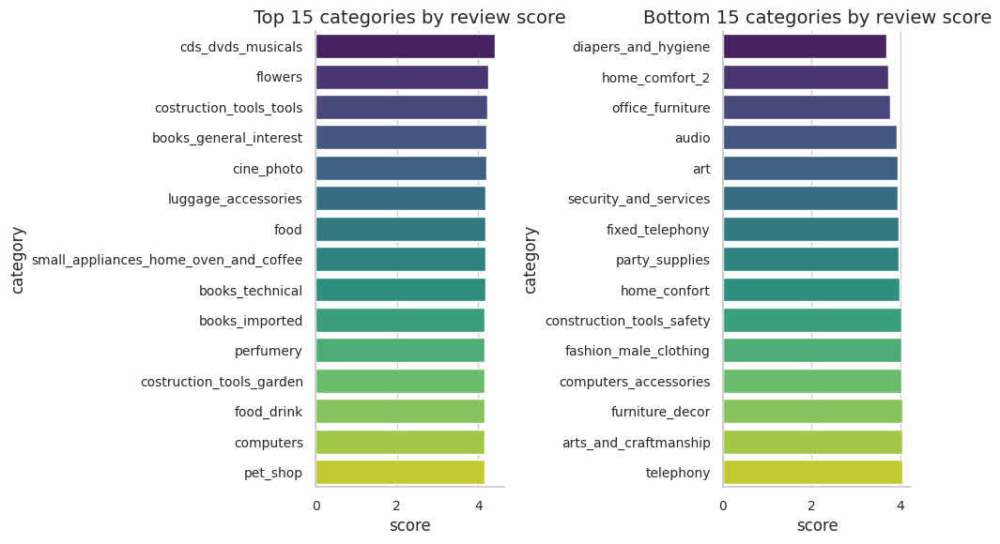

In [ ]:
category_score = product_rating.groupby("category").apply(
    lambda g: np.average(g["shrunk_score"], weights=g["n_reviews"])
)

category_score = pd.DataFrame(
    {"category": category_score.index, "score": category_score.values}
)
_, axes = plt.subplots(1, 2, figsize=(10, 6))
for is_ascending, ax in zip([False, True], axes.ravel(), strict=True):
    sns.barplot(
        data=category_score.sort_values(by="score", ascending=is_ascending).iloc[
            :15, :
        ],
        x="score",
        y="category",
        ax=ax,
        palette="viridis",
    )
    title = (
        "Bottom 15 categories by review score"
        if is_ascending
        else "Top 15 categories by review score"
    )
    ax.set_title(title)
plt.tight_layout()
plt.show()

### Reviews - Mixed Effect Model

To further quantify product-level contributions to review scores while controlling for logistics and economic factors, we fit a mixed-effects regression model.</br>
In this framework, delivery performance and pricing variables are treated as fixed effects, reflecting their consistent and systematic influence on customer satisfaction. Product identity, on the other hand, is modeled as a random effect, capturing unobserved heterogeneity in intrinsic product quality.</br>
This specification allows us to estimate product-specific deviations from the expected review score after accounting for observable factors. These deviations, obtained via Best Linear Unbiased Predictors (BLUPs), represent our best estimates of each product’s latent contribution to customer satisfaction.

In [23]:
model_mem = smf.mixedlm(
    "score ~ delay + log_delivery_time + log_price + log_freight_value + C(state)",
    data=order_rating_1p,
    groups=order_rating_1p["product"],
)

res = model_mem.fit()

res.summary()

The resulting random effects estimation let us associate to each product id the product impact on review rating:

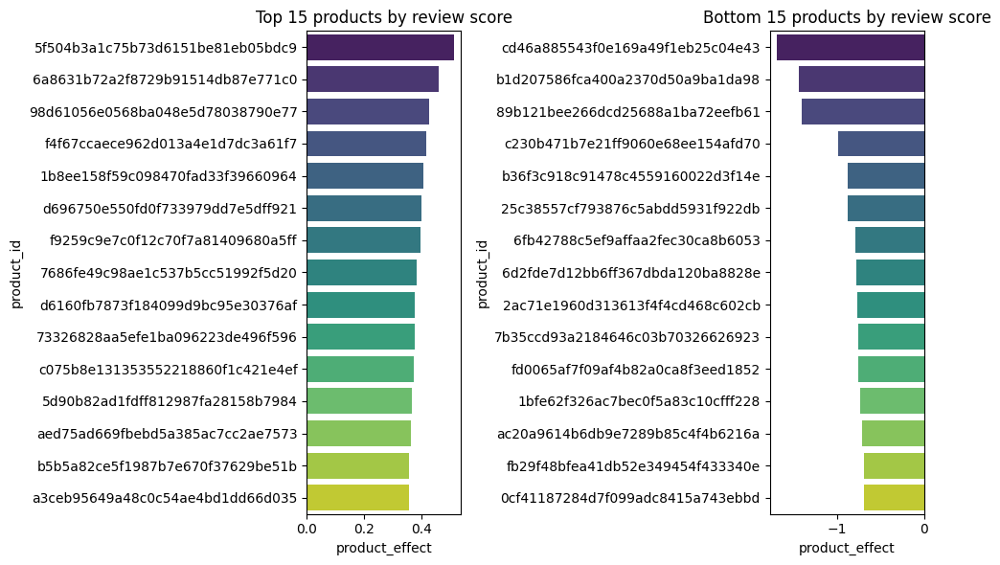

In [ ]:
product_effects = res.random_effects

product_effects = (
    pd.DataFrame.from_dict(product_effects, orient="index")
    .reset_index()
    .rename(columns={"index": "product_id", "Group": "product_effect"})
)


_, axes = plt.subplots(1, 2, figsize=(10, 6))
for is_ascending, ax in zip([False, True], axes.ravel(), strict=True):
    sns.barplot(
        data=product_effects.sort_values(
            by="product_effect", ascending=is_ascending
        ).iloc[:15, :],
        x="product_effect",
        y="product_id",
        ax=ax,
        palette="viridis",
    )
    title = (
        "Bottom 15 products by review score"
        if is_ascending
        else "Top 15 products by review score"
    )
    ax.set_title(title)
plt.tight_layout()
plt.show()

**Key insights:**
<ul>
    <li>The estimated product effects reveal an asymmetric impact on review scores: negative deviations tend to be larger in magnitude than positive ones, in some cases exceeding a full rating point. This asymmetry suggests that poor product quality penalizes customer satisfaction more strongly than high quality enhances it.</li>
</ul>

## Customer Behaviour

In this section, we examine customer purchasing behavior within the Olist marketplace. While many behavioral analyses focus on retention and repeat purchasing, it is important to recognize the structural characteristics of the Olist platform.</br>
Olist operates as a marketplace rather than a subscription-based service, and customers are not explicitly incentivized to make recurring purchases. As a result, repeat purchasing is expected to be limited, and customer behavior analysis is primarily exploratory and contextual rather than diagnostic.

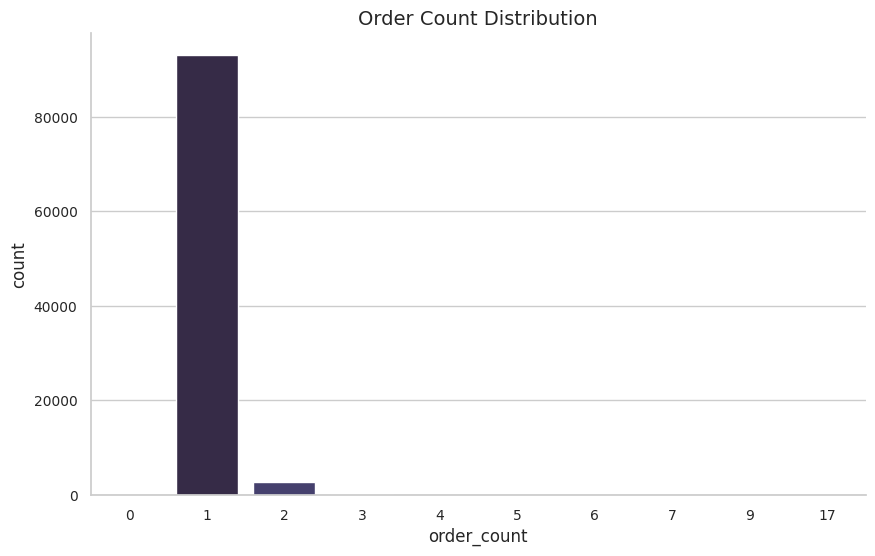

In [43]:
qry = f"""
SELECT 
    rco.customer_unique_id,
    rco.total_orders AS order_count
FROM `{PROJECT_ID}.{ROLLUP_DATASET_ID}.rollup_customer_orders` rco
WHERE rco.snapshot_date = (
    SELECT
        MAX(snapshot_date) AS last_date
    FROM `{PROJECT_ID}.{ROLLUP_DATASET_ID}.rollup_customer_orders`
)
"""

df_order_count = run_query(query=qry, project_id=PROJECT_ID)

plt.figure(figsize=(10, 6))
sns.countplot(data=df_order_count, x="order_count", palette="mako")
plt.title("Order Count Distribution")
plt.show()

In [8]:
print(
    "Percentage of customers who placed only one order: ",
    round(
        100 * (df_order_count["order_count"] == 1).sum() / df_order_count.shape[0], 2
    ),
    " %",
)

Percentage of customers who placed only one order:  96.88  %


**Key insights:**
<ul>
    <li>The distribution of order counts per customer confirms this structural characteristic: the vast majority of customers place a single order.</li>
    <li>This pattern indicates that low repeat purchasing is a fundamental property of the marketplace rather than a signal of customer dissatisfaction or poor performance.</li>
</ul>

### End-of-period customer inactivity rate

To quantify customer inactivity, we compute the End-of-Period Customer Inactivity Rate (EPCIR), defined as the proportion of customers who have made at least one purchase but have not placed any orders within a specified time window prior to a cutoff date.

Given that the dataset does not extend beyond October 2018, the most recent observed date is used as the reference point. Customers are classified as inactive if their most recent purchase occurred more than 180 days before this cutoff.

In [11]:
qry = f"""
SELECT 
    ck.customer_unique_id,
    ck.is_inactive AS is_inactive
FROM `{PROJECT_ID}.{BI_DATASET_ID}.bi_customer_kpi` ck
WHERE ck.snapshot_date = (
    SELECT
        MAX(snapshot_date)
    FROM `{PROJECT_ID}.{BI_DATASET_ID}.bi_customer_kpi`
)
"""

df_EPCIR = run_query(query=qry, project_id=PROJECT_ID)
df_EPCIR.head()

,customer_unique_id,is_inactive
0,634420a0ea42302205032ed44ac7fccc,False
1,9bb92bebd4cb7511e1a02d5e50bc4655,False
2,ba84da8c159659f116329563a0a981dd,False
3,9c3af16efacb7aa06aa3bc674556c5d6,False
4,08642cd329066fe11ec63293f714f2f8,False


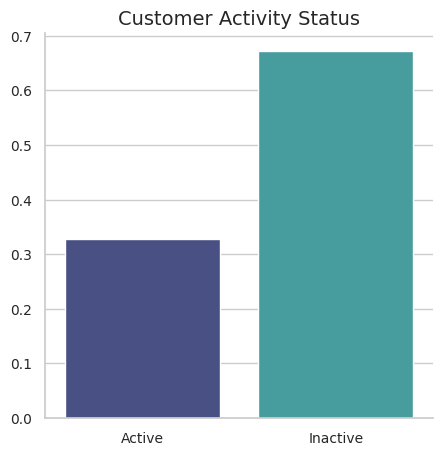

In [45]:
epcr = df_EPCIR["is_inactive"].mean()

plt.figure(figsize=(5, 5))
sns.barplot(x=["Active", "Inactive"], y=[1 - epcr, epcr], palette="mako")
plt.title("Customer Activity Status")
plt.show()

**Key insights:**
<ul>
    <li>Under this definition, approximately 67.2% of customers are classified as inactive, a result consistent with the low repeat-purchase behavior observed earlier.</li>
</ul>

## Cohort Churn Analysis

To complement the EPCIR analysis and mitigate end-of-dataset bias, we perform a cohort-based churn analysis..</br>
Customers are grouped into cohorts based on the month of their first purchase, and churn is measured over a fixed one-year window relative to acquisition:

In [54]:
qry = f"""
WITH customer_first_purchase AS (
    SELECT
        customer_unique_id,
        MIN(purchase_ts) AS first_purchase_date,
        DATE_TRUNC(MIN(purchase_ts), MONTH) AS cohort_month
    FROM `{PROJECT_ID}.{CORE_DATASET_ID}.fact_orders`
    GROUP BY customer_unique_id
),

customer_activity AS (
    SELECT
        fp.customer_unique_id,
        fp.cohort_month,
        fp.first_purchase_date,
        COUNTIF(
            o.purchase_ts > fp.first_purchase_date
            AND DATE_DIFF(o.purchase_ts, fp.first_purchase_date, DAY) <= 365
        ) AS repeat_purchases_365d
    FROM customer_first_purchase fp
    LEFT JOIN `{PROJECT_ID}.{CORE_DATASET_ID}.fact_orders` o
        ON fp.customer_unique_id = o.customer_unique_id
    GROUP BY
        fp.customer_unique_id,
        fp.cohort_month,
        fp.first_purchase_date
)

SELECT
    cohort_month,
    COUNT(*) AS cohort_size,
    COUNTIF(repeat_purchases_365d > 0) AS retained_365d,
    COUNTIF(repeat_purchases_365d = 0) AS churned_365d,
    SAFE_DIVIDE(
        COUNTIF(repeat_purchases_365d = 0),
        COUNT(*)
    ) AS churn_rate_365d
FROM customer_activity
GROUP BY cohort_month
ORDER BY cohort_month;
"""

df_cohort = run_query(query=qry, project_id=PROJECT_ID)
df_cohort

,cohort_month,cohort_size,retained_365d,churned_365d,churn_rate_365d
0,2016-09-01 00:00:00+00:00,4,0,4,1.000000
1,2016-10-01 00:00:00+00:00,321,6,315,0.981308
2,2016-12-01 00:00:00+00:00,1,1,0,0.000000
3,2017-01-01 00:00:00+00:00,764,42,722,0.945026
4,2017-02-01 00:00:00+00:00,1752,59,1693,0.966324
5,2017-03-01 00:00:00+00:00,2636,107,2529,0.959408
6,2017-04-01 00:00:00+00:00,2352,93,2259,0.960459
7,2017-05-01 00:00:00+00:00,3596,169,3427,0.953003
8,2017-06-01 00:00:00+00:00,3139,154,2985,0.950940
9,2017-07-01 00:00:00+00:00,3894,161,3733,0.958654


**Key insights:**
<ul>
    <li>Cohort churn rates remain extremely high, ranging between 94% and 100%. In the context of the Olist marketplace, these values should not be interpreted as poor retention performance. Instead, they reflect a business model centered on durable goods and infrequent repurchase cycles.</li>
</ul>
Overall, customer behavior metrics reinforce the characterization of Olist as a transaction-oriented marketplace rather than a relationship-driven platform. Consequently, traditional retention-focused KPIs offer limited diagnostic value, and performance evaluation should primarily focus on demand acquisition, logistics efficiency, and seller performance.

## Conclusions

THe analysis of the Olist Brazilian ecommerce dataset reveals several insights with direct implications for marketplace strategy, logistic operations and growth opportunities.
<ul>
     <li>The seasonality of purchasing behavior suggest an utilitarian demand that is relatively insensitive to holidays. Instead, demand responds more strongly to promotional events, highlighting the strategic importance of well-timed promotions over seasonal campaigns.</li>
     <li>The North-East region shows higher logistics risk, indicating a need for closer monitring and potential targeted investements to improve delivery performance and customer experience.</li>
    <li>Revenue concentration is driven by a relatively small number of product categories, primarily related to personal and household care, suggesting category specialization as a key driver of marketplace performance.</li>
    <li>Delivery delays have a systematic negative impact on review scores; combined with the transaction-oriented nature of the Olist marketplace, this indicates that growth opportunities are likely to stem from demand acquisition strategies and improvements in supply-side and logistics performance.</li>
</ul>